In [9]:
import numpy as np 
import os 
from skimage import io 
from skimage.transform import resize 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score 
from sklearn.model_selection import train_test_split 
from matplotlib import pyplot as plt 
import pandas as pd

import numpy as np
import os
from skimage import io
from skimage.transform import resize
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt
import pandas as pd

In [10]:
# Define the paths to the three directories containing your images
car_dir = "/Users/linafadhli/balanced_images/cars"
truck_dir = "/Users/linafadhli/balanced_images/trucks"
bike_dir = "/Users/linafadhli/balanced_images/bikes"

# Load and preprocess the images
car_images = []
for filename in os.listdir(car_dir):
    img = io.imread(os.path.join(car_dir, filename))
    img_resized = resize(img, (100, 100))
    car_images.append(img_resized)
car_labels = np.zeros(len(car_images))

truck_images = []
for filename in os.listdir(truck_dir):
    img = io.imread(os.path.join(truck_dir, filename))
    img_resized = resize(img, (100, 100))
    truck_images.append(img_resized)
truck_labels = np.ones(len(truck_images))

bike_images = []
for filename in os.listdir(bike_dir):
    img = io.imread(os.path.join(bike_dir, filename))
    img_resized = resize(img, (100, 100))
    bike_images.append(img_resized)
bike_labels = np.full(len(bike_images), 2)

X = np.concatenate((car_images, truck_images, bike_images))
y = np.concatenate((car_labels, truck_labels, bike_labels))


In [3]:
df = pd.DataFrame(columns=["Number of Estimators","Max Depth","Accuracy","F1 Micro","F1 Macro","Recall","Precision"])

In [4]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

max_depth_lis = [6,7,8,9,10]
n_estimators_lis = [100,200,300,500,700]
# Train a Random Forest classifier
for max_depth in max_depth_lis:
    for n_estimators in n_estimators_lis:
        clf = RandomForestClassifier(n_estimators=n_estimators,criterion="log_loss",max_depth=max_depth, random_state=5467,n_jobs=3)
        clf.fit(X_train.reshape(X_train.shape[0], -1), y_train)

        # Predict on the test set
        y_pred = clf.predict(X_test.reshape(X_test.shape[0], -1))

        # Compute accuracy
        accuracy = accuracy_score(y_test, y_pred)

        f1_micro = f1_score(average='micro', y_true = y_test, y_pred = y_pred)
        f1_macro = f1_score(average='macro', y_true = y_test, y_pred = y_pred)

        recall = recall_score(average='weighted', y_true = y_test, y_pred = y_pred)
        precision = precision_score(average='weighted', y_true = y_test, y_pred = y_pred)

        dict = {
            'Number of Estimators': n_estimators,
            'Max Depth': max_depth,
            'Accuracy': accuracy,
            'F1 Micro': f1_micro,
            'F1 Macro': f1_macro,
            'Recall': recall,
            'Precision': precision
        }
        df = df.append(dict,ignore_index=True)
        print("Accuracy:", accuracy)

/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8576923076923076


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8538461538461538


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8538461538461538


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8538461538461538


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8538461538461538


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8615384615384616


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8576923076923076


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8615384615384616


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8615384615384616


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8615384615384616


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8692307692307693


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8692307692307693


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8769230769230769


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8692307692307693


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8692307692307693


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8692307692307693


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8769230769230769


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8769230769230769


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8730769230769231


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8692307692307693


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8730769230769231


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8769230769230769


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8769230769230769


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


Accuracy: 0.8730769230769231
Accuracy: 0.8730769230769231


/var/folders/3w/9w_c1t4d7ds7dnwn2v4_zmwr0000gn/T/ipykernel_65670/3116656532.py:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(dict,ignore_index=True)


In [5]:
df.sort_values(by="Accuracy",ascending=False)

,Number of Estimators,Max Depth,Accuracy,F1 Micro,F1 Macro,Recall,Precision
12,300.0,8.0,0.876923,0.876923,0.874361,0.876923,0.887224
16,200.0,9.0,0.876923,0.876923,0.874091,0.876923,0.885550
22,300.0,10.0,0.876923,0.876923,0.874629,0.876923,0.884877
21,200.0,10.0,0.876923,0.876923,0.874091,0.876923,0.885550
17,300.0,9.0,0.876923,0.876923,0.874629,0.876923,0.884877
23,500.0,10.0,0.873077,0.873077,0.869928,0.873077,0.882612
20,100.0,10.0,0.873077,0.873077,0.869928,0.873077,0.882612
18,500.0,9.0,0.873077,0.873077,0.869851,0.873077,0.882190
24,700.0,10.0,0.873077,0.873077,0.869928,0.873077,0.882612
10,100.0,8.0,0.869231,0.869231,0.866564,0.869231,0.880460


In [6]:
df

,Number of Estimators,Max Depth,Accuracy,F1 Micro,F1 Macro,Recall,Precision
0,100.0,6.0,0.857692,0.857692,0.854873,0.857692,0.868392
1,200.0,6.0,0.853846,0.853846,0.850915,0.853846,0.867652
2,300.0,6.0,0.853846,0.853846,0.851289,0.853846,0.865012
3,500.0,6.0,0.853846,0.853846,0.850647,0.853846,0.865374
4,700.0,6.0,0.853846,0.853846,0.850675,0.853846,0.865532
5,100.0,7.0,0.861538,0.861538,0.858062,0.861538,0.874400
6,200.0,7.0,0.857692,0.857692,0.854500,0.857692,0.871032
7,300.0,7.0,0.861538,0.861538,0.858729,0.861538,0.873995
8,500.0,7.0,0.861538,0.861538,0.859106,0.861538,0.871669
9,700.0,7.0,0.861538,0.861538,0.859106,0.861538,0.871669


In [7]:
y_pred

array([0., 2., 0., 2., 1., 0., 1., 0., 1., 0., 2., 0., 2., 1., 0., 1., 2.,
       0., 0., 2., 2., 1., 0., 1., 1., 0., 0., 0., 0., 2., 2., 1., 2., 2.,
       2., 2., 0., 0., 1., 1., 1., 2., 1., 2., 2., 2., 1., 0., 2., 1., 1.,
       1., 1., 0., 1., 0., 0., 2., 2., 0., 1., 2., 0., 1., 2., 2., 1., 1.,
       2., 2., 1., 2., 0., 0., 0., 2., 1., 0., 1., 2., 0., 2., 0., 1., 2.,
       1., 1., 1., 2., 0., 1., 0., 0., 2., 0., 0., 1., 1., 2., 2., 2., 1.,
       2., 2., 0., 0., 0., 0., 1., 0., 2., 1., 2., 0., 2., 1., 2., 2., 2.,
       1., 1., 1., 1., 1., 2., 0., 2., 2., 0., 1., 2., 2., 1., 2., 2., 1.,
       0., 2., 2., 2., 1., 0., 2., 2., 2., 0., 1., 0., 1., 2., 0., 1., 1.,
       2., 1., 1., 1., 1., 0., 1., 1., 2., 2., 1., 1., 2., 2., 0., 1., 0.,
       0., 1., 0., 1., 2., 1., 2., 1., 1., 2., 1., 2., 2., 2., 1., 1., 2.,
       0., 1., 2., 2., 2., 1., 1., 2., 1., 2., 2., 2., 2., 0., 1., 2., 2.,
       2., 1., 1., 1., 2., 2., 1., 1., 2., 1., 2., 2., 1., 0., 2., 1., 1.,
       2., 0., 2., 2., 0.

In [8]:
X_test_flat = X_test.reshape(X_test.shape[0], -1)
y_pred = clf.predict(X_test_flat)
label_names = ['car', 'truck', 'bike']

In [9]:
X_test

array([[[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [

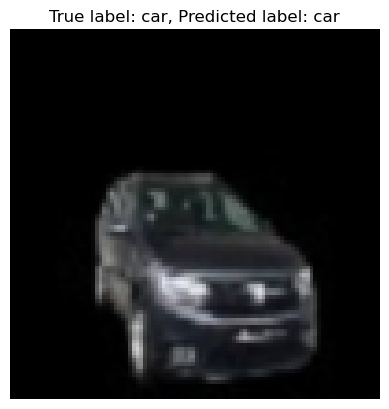

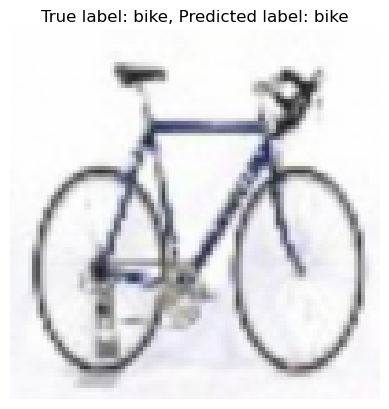

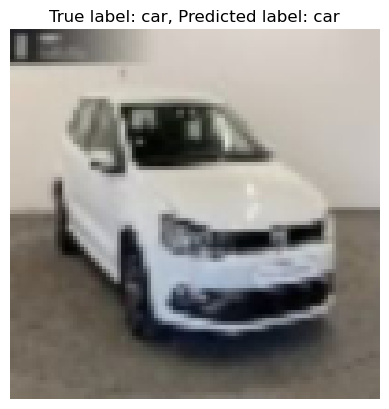

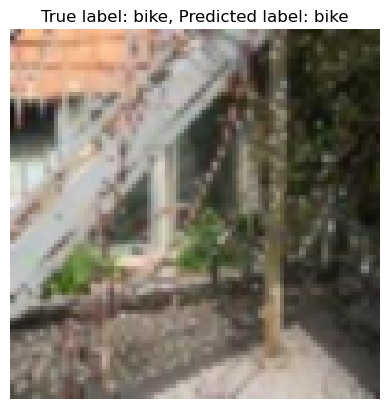

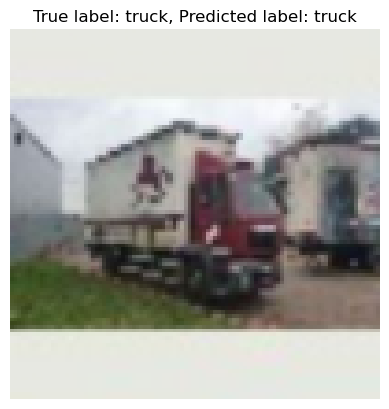

...

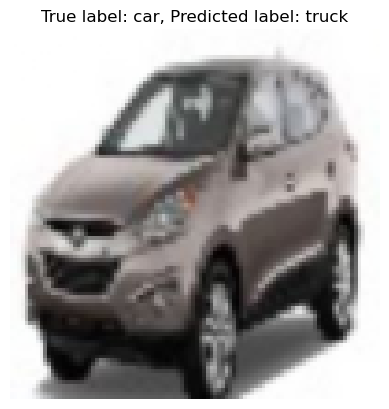

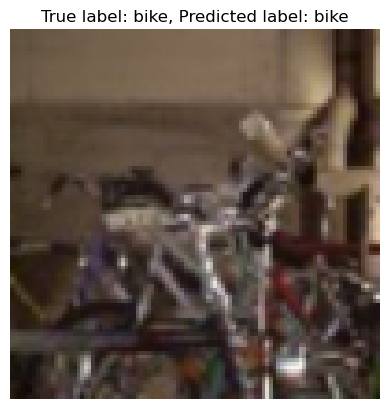

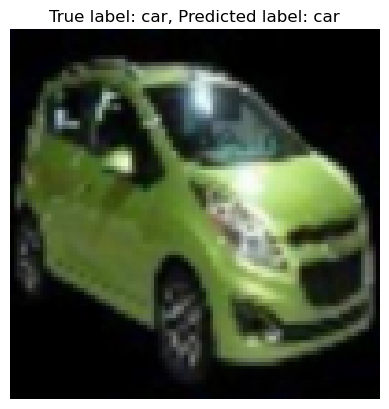

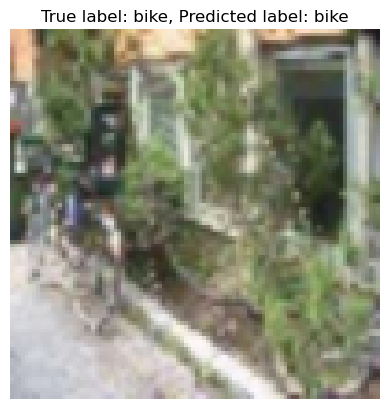

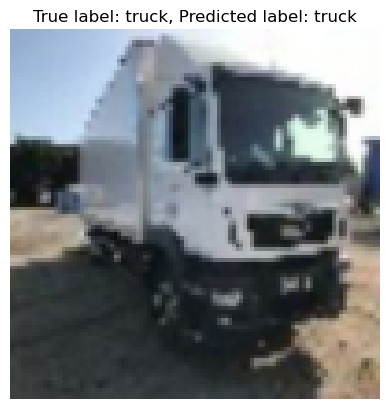

In [13]:
# Reshape the images into 2D arrays


# Predict on the test set



# Display each image with its true label and predicted label
for i in range(len(X_test)):
    image = X_test[i]
    true_label = y_test[i]
    predicted_label = y_pred[i]

    # Convert the one-hot encoded labels back to class names
    true_label = label_names[int(true_label)]
    predicted_label = label_names[int(predicted_label)]

    # Display the image with its true and predicted labels
    plt.imshow(image)
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.axis("off")
    plt.show()

In [13]:
 y_test

array([0., 2., 0., 2., 1., 0., 0., 0., 1., 0., 2., 0., 2., 1., 0., 1., 2.,
       0., 0., 2., 2., 1., 0., 1., 1., 0., 0., 0., 0., 2., 0., 1., 2., 1.,
       2., 2., 0., 0., 1., 1., 1., 2., 1., 2., 2., 0., 1., 0., 0., 1., 1.,
       1., 1., 0., 1., 0., 0., 2., 2., 0., 1., 0., 0., 1., 2., 2., 1., 1.,
       2., 2., 1., 2., 0., 0., 1., 2., 1., 0., 1., 2., 0., 2., 0., 1., 0.,
       1., 1., 1., 2., 0., 1., 0., 0., 2., 0., 0., 1., 1., 2., 2., 2., 1.,
       0., 2., 0., 0., 0., 0., 1., 0., 2., 1., 2., 0., 2., 0., 0., 2., 2.,
       1., 1., 1., 1., 1., 2., 0., 2., 2., 0., 2., 1., 2., 0., 2., 2., 1.,
       0., 2., 2., 2., 1., 0., 2., 2., 2., 0., 1., 0., 1., 2., 0., 1., 1.,
       2., 0., 0., 1., 1., 0., 1., 1., 2., 2., 1., 1., 2., 2., 1., 1., 0.,
       0., 1., 0., 1., 2., 1., 2., 1., 0., 2., 1., 2., 2., 0., 1., 1., 2.,
       0., 1., 2., 0., 0., 2., 1., 1., 1., 0., 2., 2., 2., 0., 0., 2., 2.,
       2., 1., 1., 1., 2., 2., 1., 1., 2., 1., 2., 2., 1., 0., 2., 1., 1.,
       0., 0., 2., 2., 0.

In [15]:
len(y_test)

260

In [16]:
len(y_pred)

260

Normalized confusion matrix
[[0.77906977 0.13953488 0.08139535]
 [0.05747126 0.89655172 0.04597701]
 [0.04597701 0.02298851 0.93103448]]


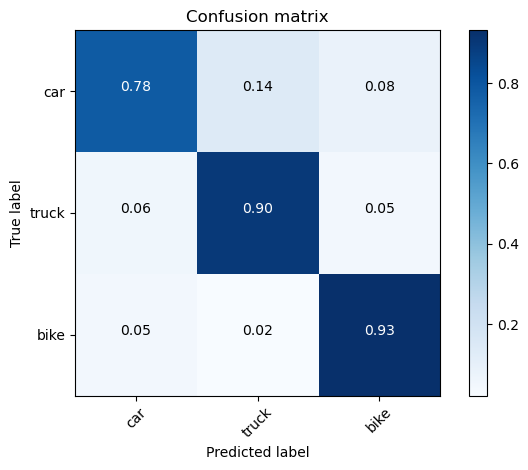

In [22]:
import numpy as np
import itertools
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using matplotlib
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print("Confusion matrix, without normalization")

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

# Update the class_names variable for 3 classes (0, 1, and 2)
class_names = ['car', 'truck', 'bike']
plot_confusion_matrix(cm, classes=class_names, normalize=True, title='Confusion matrix')

plt.show()
